In [ ]:
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import cv2
import skimage.io
import skimage.color
import skimage.filters
from scipy import signal
import random

In [ ]:
!gdown 1YhKd9aV_CVtcCskX1LZR3TGxeBgTyDbL
!gdown 16WGhXm6YwnV-FrgTUZg9mExrh4kf_50f
!gdown 1kQrW_AmzNI8Y33G9lJkV5QvNcxTK9yY-

Downloading...
From: https://drive.google.com/uc?id=1YhKd9aV_CVtcCskX1LZR3TGxeBgTyDbL
To: /content/Fig0333(a)(test_pattern_blurring_orig).tif
100% 250k/250k [00:00<00:00, 120MB/s]
Downloading...
From: https://drive.google.com/uc?id=16WGhXm6YwnV-FrgTUZg9mExrh4kf_50f
To: /content/Fig0338(a)(blurry_moon).tif
100% 252k/252k [00:00<00:00, 95.0MB/s]
Downloading...
From: https://drive.google.com/uc?id=1kQrW_AmzNI8Y33G9lJkV5QvNcxTK9yY-
To: /content/Fig0335(a)(ckt_board_saltpep_prob_pt05).tif
100% 201k/201k [00:00<00:00, 90.1MB/s]


#Task # 01 (Linear Filter)

<h2>a) Implement the Smoothing Operation with Average Filter (Box & Weighted Average filters)</h2>

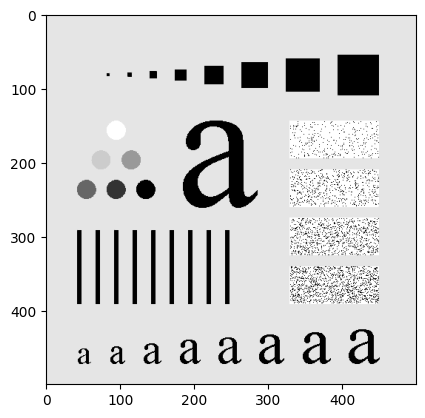

In [ ]:
img1 = cv2.imread("/content/Fig0333(a)(test_pattern_blurring_orig).tif")
img1 = np.array(cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY))
plt.imshow(img1, cmap='gray')
plt.show()

>Explanation : The functions an image with a kernel. The function pads the image based on the kernel size so that its size doesnt get reduced when convolved. Then it iterates through each pixel and performs element wise multiplication between the kernel and the local neighborhood and then calculates the sum of the resulting values as the value of the pixel at that position.

In [ ]:
def convolution(image, kernel):

    image_h, image_w = image.shape
    kernel_h, kernel_w = kernel.shape

    output = np.zeros(image.shape)

    if kernel_h % 2 == 0 or kernel_w % 2 == 0:
        raise ValueError("Kernel dimensions should be odd.")

    pad_height = kernel_h // 2
    pad_width = kernel_w  // 2

    padded_image = np.pad(image, ((pad_height, pad_height), (pad_width, pad_width)), mode='constant')

    for i in range(image_h):
        for j in range(image_w):
            region = padded_image[i:i+kernel_h, j:j+kernel_w]

            output[i, j] = np.sum(region * kernel)

    return output

<h3> i) Box Filter </h3>

>Explanation : Generates a box filter each having same weighted value having sum 1.

In [ ]:
def box_filter(n):
    filter = np.ones((n, n))
    filter = filter * (1/(n*n))
    return filter

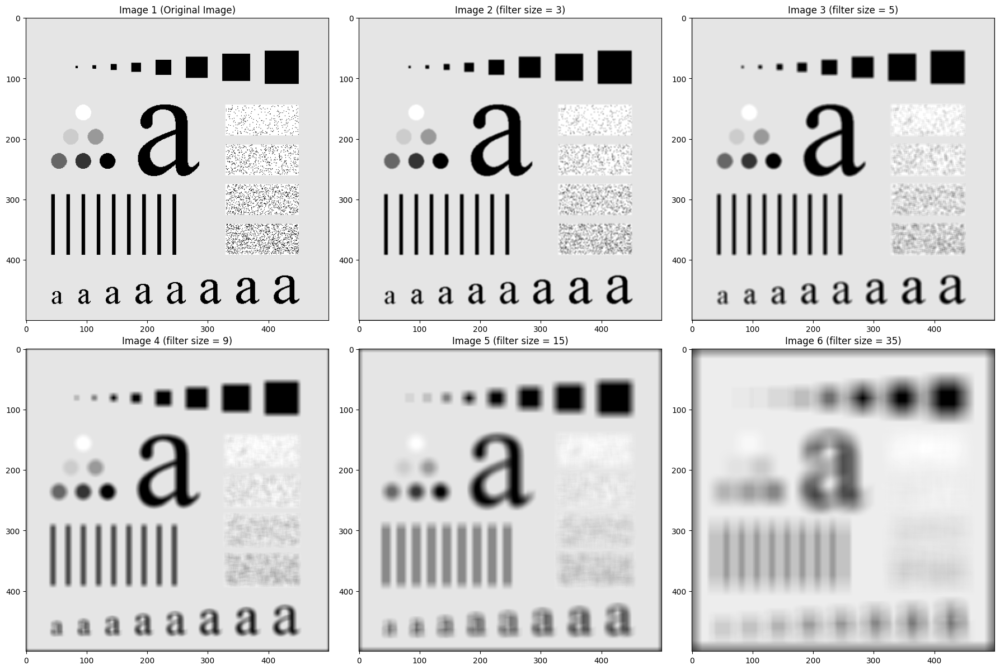

In [ ]:
fig, axs = plt.subplots(2, 3, figsize=(18, 12))

plt.subplot(2, 3, 1)
plt.imshow(img1, cmap='gray')

plt.title("Image 1 (Original Image)")

plt.subplot(2, 3, 2)
box = box_filter(3)
result = convolution(img1, box)
plt.imshow(result, cmap='gray')

plt.title("Image 2 (filter size = 3)")

plt.subplot(2, 3, 3)
box = box_filter(5)
result = convolution(img1, box)
plt.imshow(result, cmap='gray')

plt.title("Image 3 (filter size = 5)")

plt.subplot(2, 3, 4)
box = box_filter(9)
result = convolution(img1, box)
plt.imshow(result, cmap='gray')

plt.title("Image 4 (filter size = 9)")

plt.subplot(2, 3, 5)
box = box_filter(15)
result = convolution(img1, box)
plt.imshow(result, cmap='gray')

plt.title("Image 5 (filter size = 15)")

plt.subplot(2, 3, 6)
box = box_filter(35)
result = convolution(img1, box)
plt.imshow(result, cmap='gray')

plt.title("Image 6 (filter size = 35)")


plt.tight_layout()
plt.show()


>Explanation : As we increase the filter size of the box filter and convolve with the image, the images gets smoothened or blurred as the operation averages the pixel value over a local neighbourhood. As the filter size increases, the local neighbourhood gets bigger and the pixel loses more details resulting it blurrier images.

<h3> ii) Weighted Average Filter </h3>

>Explanation : The functions generated a weighted average filter.

In [ ]:
def weighted_avg_filter(n):

    ax = np.zeros(n)
    for i in range(n//2 + 1):
        ax[i] = 2**i
        ax[n - i - 1] = ax[i]
    kernel = np.outer(ax, ax)

    return kernel / np.sum(kernel)

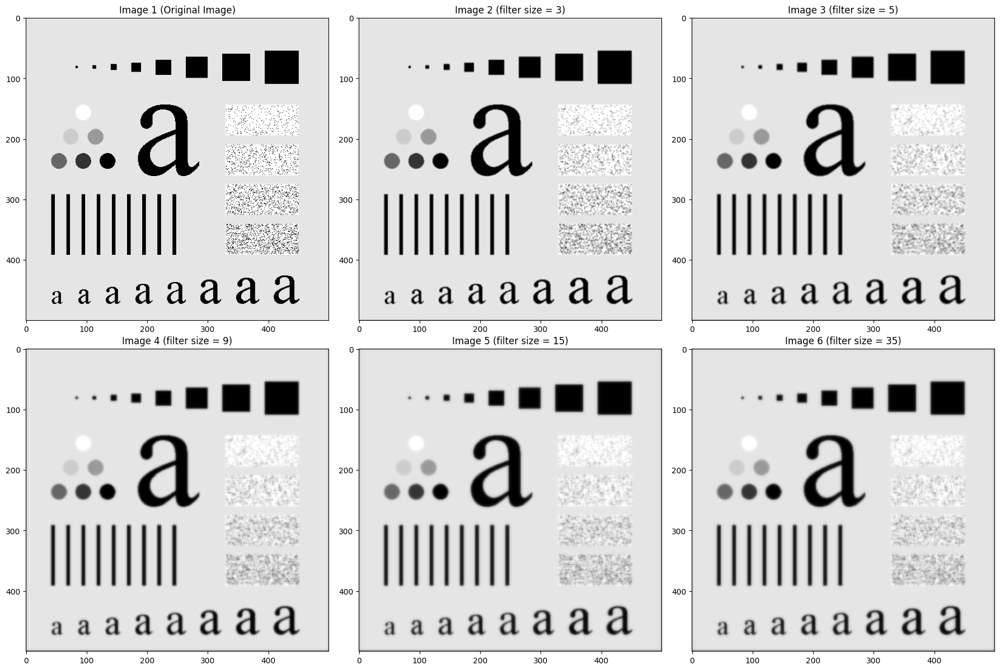

In [ ]:
fig, axs = plt.subplots(2, 3, figsize=(18, 12))

plt.subplot(2, 3, 1)
plt.imshow(img1, cmap='gray')

plt.title("Image 1 (Original Image)")

plt.subplot(2, 3, 2)
wav = weighted_avg_filter(3)
result = convolution(img1, wav)
plt.imshow(result, cmap='gray')

plt.title("Image 2 (filter size = 3)")

plt.subplot(2, 3, 3)
wav = weighted_avg_filter(5)
result = convolution(img1, wav)
plt.imshow(result, cmap='gray')

plt.title("Image 3 (filter size = 5)")

plt.subplot(2, 3, 4)
wav = weighted_avg_filter(9)
result = convolution(img1, wav)
plt.imshow(result, cmap='gray')

plt.title("Image 4 (filter size = 9)")

plt.subplot(2, 3, 5)
wav = weighted_avg_filter(15)
result = convolution(img1, wav)
plt.imshow(result, cmap='gray')

plt.title("Image 5 (filter size = 15)")

plt.subplot(2, 3, 6)
wav = weighted_avg_filter(15)
result = convolution(img1, wav)
plt.imshow(result, cmap='gray')

plt.title("Image 6 (filter size = 35)")


plt.tight_layout()
plt.show()


>Explanation : As the filter size increases the images gets blurrier as a larger neighbourhood's weighted average is considered for the value of each pixel. Since the center value of kernel has the highest value, it doesnt lose as much as details as box filter. Thus this is better in preserving image details and in the same time smoothing the image.

<h3>c) Explain how the blurring effect can be increased or decreased.
</h3>

>Explanation : When an image is convolved with a box or weighted average filter, it causes a blurring effect as the pixel values are averaged within a local neighbourhood. As the filter size grows, the neighborhood considered for averaging becomes larger. This means that more surrounding pixel values are taken into account when computing the average (or weighted average) for each pixel in the filtered image. Consequently, the blurring effect becomes more pronounced. Larger filter sizes result in more significant smoothing and a greater reduction in image detail (blurring).

>In the following image we have subtracted the convolved image from the original image where white regions mark higher difference and darker regions denote they didnt change much. We can see that, as filter size increases, the white regions gets more dominant. It can also be noticed that application of box filter loses more details than weighted average filter as there are more brighter regions in the difference with box filter images with same filter value.

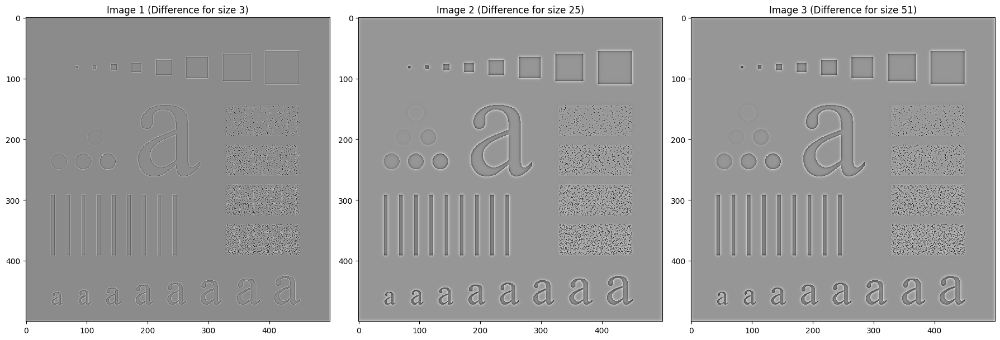

In [ ]:
fig, axs = plt.subplots(1, 3, figsize=(18, 12))

plt.subplot(1, 3, 1)
wav = weighted_avg_filter(3)
result = convolution(img1, wav)
result = img1 - result
plt.imshow(result, cmap='gray')

plt.title("Image 1 (Difference for size 3)")

plt.subplot(1, 3, 2)
wav = weighted_avg_filter(25)
result = convolution(img1, wav)
result = img1 - result
plt.imshow(result, cmap='gray')

plt.title("Image 2 (Difference for size 25)")

plt.subplot(1, 3, 3)
wav = weighted_avg_filter(51)
result = convolution(img1, wav)
result = img1 - result
plt.imshow(result, cmap='gray')

plt.title("Image 3 (Difference for size 51)")

plt.tight_layout()
plt.show()

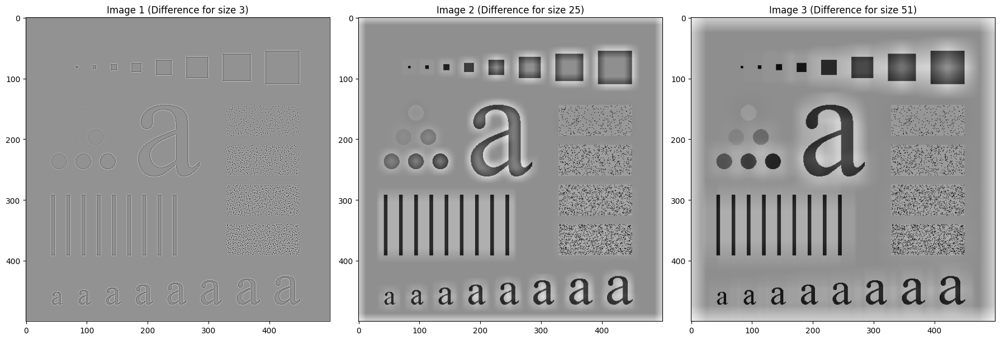

In [ ]:
fig, axs = plt.subplots(1, 3, figsize=(18, 12))

plt.subplot(1, 3, 1)
box = box_filter(3)
result = convolution(img1, box)
result = img1 - result
plt.imshow(result, cmap='gray')

plt.title("Image 1 (Difference for size 3)")

plt.subplot(1, 3, 2)
box = box_filter(25)
result = convolution(img1, box)
result = img1 - result
plt.imshow(result, cmap='gray')

plt.title("Image 2 (Difference for size 25)")

plt.subplot(1, 3, 3)
box = box_filter(51)
result = convolution(img1, box)
result = img1 - result
plt.imshow(result, cmap='gray')

plt.title("Image 3 (Difference for size 51)")

plt.tight_layout()
plt.show()

#Task # 02 (Non-Linear Filter)

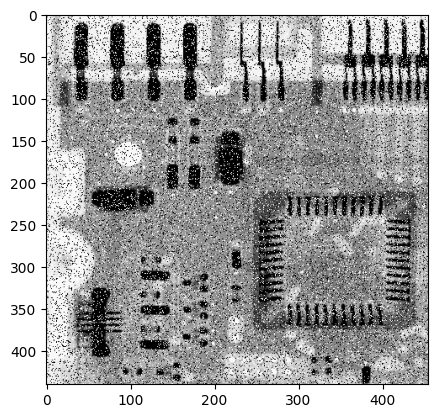

In [ ]:
img2 = cv2.imread("/content/Fig0335(a)(ckt_board_saltpep_prob_pt05).tif")
img2 = np.array(cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY))
plt.imshow(img2, cmap='gray')
plt.show()

<h3>a) Use a function (built-in or your own) to artificially add Salt&Pepper noise to the image.</h3>

>Explanation : Salt and pepper noise is a noise characterized by the  presence of black and white pixels which are randomly scattered over the image. For every pixel we generate a random number floating between (0~1) which is compared to a value. IF the random value is less than the given probility then its replaced by black pixel, if its greater than (1-probability) value then its replaced by a white pixel. Otherwise it remains as it is.

In [ ]:
def salt_and_pepper_noise(image, probability):
  output = np.zeros_like(image)

  for i in range(image.shape[0]):
        for j in range(image.shape[1]):
          x = random.random()

          if x < probability:
              output[i, j] = 0
          elif x > (1-probability):
              output[i, j] = 255
          else:
              output[i, j] = image[i, j]
  return output


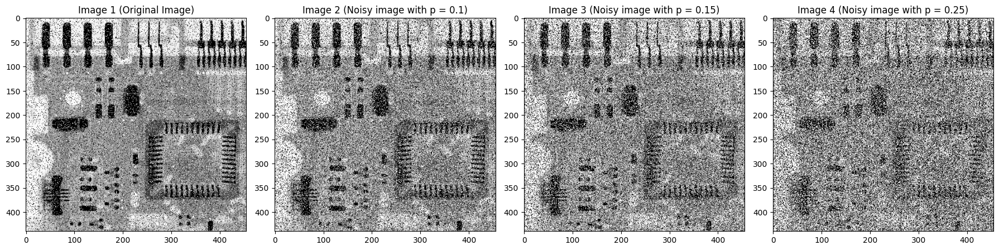

In [ ]:
fig, axs = plt.subplots(1, 4, figsize=(18, 12))

plt.subplot(1, 4, 1)
plt.imshow(img2, cmap='gray')

plt.title("Image 1 (Original Image)")

plt.subplot(1, 4, 2)
noisy_img = salt_and_pepper_noise(img2, 0.1)
plt.imshow(noisy_img, cmap='gray')

plt.title("Image 2 (Noisy image with p = 0.1)")

plt.subplot(1, 4, 3)
noisy_img = salt_and_pepper_noise(img2, 0.15)
plt.imshow(noisy_img, cmap='gray')

plt.title("Image 3 (Noisy image with p = 0.15)")

plt.subplot(1, 4, 4)
noisy_img = salt_and_pepper_noise(img2, 0.25)
plt.imshow(noisy_img, cmap='gray')

plt.title("Image 4 (Noisy image with p = 0.25)")


plt.tight_layout()
plt.show()

>Explanation : As the probability value increases we see more salt and pepper noise (more noise).

<h3>b) Implement the Noise (Salt&Pepper) Reduction technique using Median Filter as well Max/Min filters</h3>

<h2>Median Filter</h2>

>Explanation : A median filter function loops through all the pixels in an image. For each pixel, the function calculates the median of the surrounding pixels in the padded image.

In [ ]:
def median_filter(img, window):
    h, w = img.shape

    pad_width = (window-1)//2
    out = np.zeros(img.shape)
    img_pad = np.pad(img, pad_width=pad_width)
    x, y = 0, 0

    for i in range(h + (2*pad_width) - window):
        y = 0
        for j in range(w + (2*pad_width) - window):
            out[x, y] = np.median(img_pad[i:i+window, j:j+window])
            y = y + 1
        x = x + 1

    return out

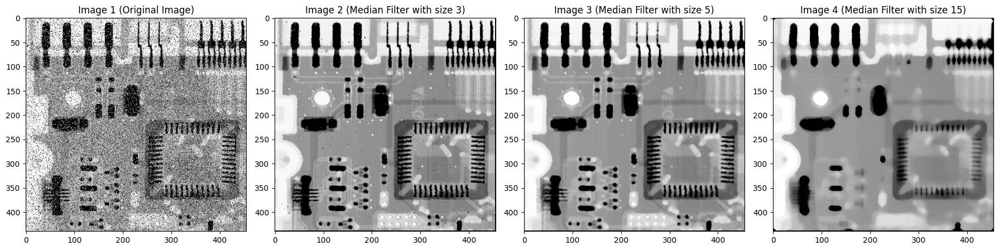

In [ ]:
fig, axs = plt.subplots(1, 4, figsize=(18, 12))

plt.subplot(1, 4, 1)
plt.imshow(img2, cmap='gray')

plt.title("Image 1 (Original Image)")

plt.subplot(1, 4, 2)
median = median_filter(img2, 3)
plt.imshow(median, cmap='gray')

plt.title("Image 2 (Median Filter with size 3)")

plt.subplot(1, 4, 3)
median = median_filter(img2, 5)
plt.imshow(median, cmap='gray')

plt.title("Image 3 (Median Filter with size 5)")

plt.subplot(1, 4, 4)
median = median_filter(img2, 15)
plt.imshow(median, cmap='gray')

plt.title("Image 4 (Median Filter with size 15)")


plt.tight_layout()
plt.show()

>Explanation : As the filter size increases, the resultant image gets smoother and blurred and starts to lose fine details.

<h2>Max Filter</h2>

>Explanation : The max filter assigns the value of a pixel equal to the largest value in the local neighbourhood based on filter size.

In [ ]:
def max_filter(img, window):
    h, w = img.shape

    pad_width = (window-1)//2
    out = np.zeros(img.shape)
    img_pad = np.pad(img, pad_width=pad_width)
    x, y = 0, 0

    for i in range(h + (2*pad_width) - window):
        y = 0
        for j in range(w + (2*pad_width) - window):
            out[x, y] = np.max(img_pad[i:i+window, j:j+window])
            y = y + 1
        x = x + 1

    return out

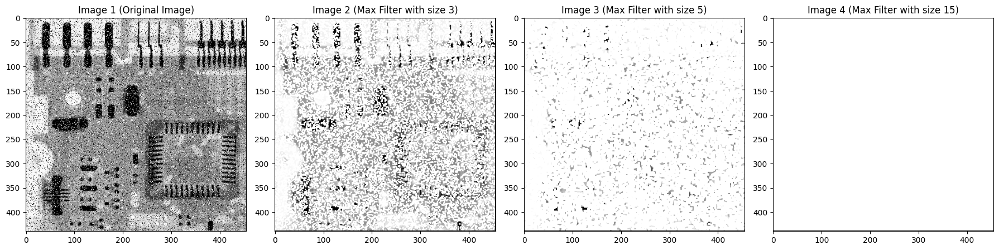

In [ ]:
fig, axs = plt.subplots(1, 4, figsize=(18, 12))

plt.subplot(1, 4, 1)
plt.imshow(img2, cmap='gray')

plt.title("Image 1 (Original Image)")

plt.subplot(1, 4, 2)
max = max_filter(img2, 3)
plt.imshow(max, cmap='gray')

plt.title("Image 2 (Max Filter with size 3)")

plt.subplot(1, 4, 3)
max = max_filter(img2, 5)
plt.imshow(max, cmap='gray')

plt.title("Image 3 (Max Filter with size 5)")

plt.subplot(1, 4, 4)
max = max_filter(img2, 15)
plt.imshow(max, cmap='gray')

plt.title("Image 4 (Max Filter with size 15)")



plt.tight_layout()
plt.show()

>Explanation : As the size of filter increases, the images gets brighter (indicating higher values). This is not an ideal smoothing filter as it only considers the highest value in the neighbourhood, so it doesnt capture any details.

<h2>Min Filter</h2>

>Explanation : The min filter assigns the value of a pixel equal to the smallest value in the local neighbourhood based on filter size.

In [ ]:
def min_filter(img, window):
    h, w = img.shape

    pad_width = (window-1)//2
    out = np.zeros(img.shape)
    img_pad = np.pad(img, pad_width=pad_width)
    x, y = 0, 0

    for i in range(h + (2*pad_width) - window):
        y = 0
        for j in range(w + (2*pad_width) - window):
            out[x, y] = np.min(img_pad[i:i+window, j:j+window])
            y = y + 1
        x = x + 1

    return out

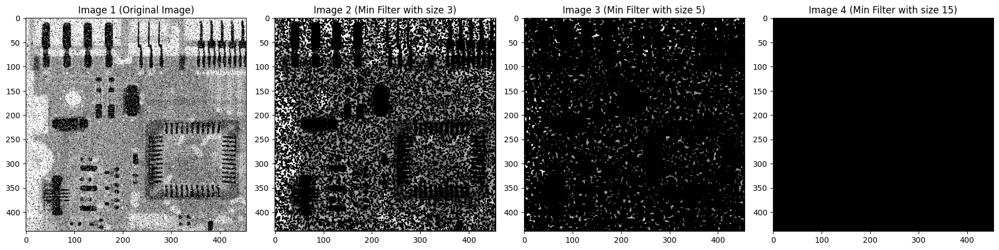

In [ ]:
fig, axs = plt.subplots(1, 4, figsize=(18, 12))

plt.subplot(1, 4, 1)
plt.imshow(img2, cmap='gray')

plt.title("Image 1 (Original Image)")

plt.subplot(1, 4, 2)
min = min_filter(img2, 3)
plt.imshow(min, cmap='gray')

plt.title("Image 2 (Min Filter with size 3)")

plt.subplot(1, 4, 3)
min = min_filter(img2, 5)
plt.imshow(min, cmap='gray')

plt.title("Image 3 (Min Filter with size 5)")

plt.subplot(1, 4, 4)
min = min_filter(img2, 15)
plt.imshow(min, cmap='gray')

plt.title("Image 4 (Min Filter with size 15)")



plt.tight_layout()
plt.show()

>Explanation : As the size of filter increases, the images gets darker (indicating lower values). This is not an ideal smoothing filter as it only considers the lowest value in the neighbourhood, so it doesnt capture any details.

<h3>c) Analyze the changes in result by varying the noise amount. Change filter size too.</h3>

Text(0.5, 1.0, 'Image 4 (Median Filter with size 15)')

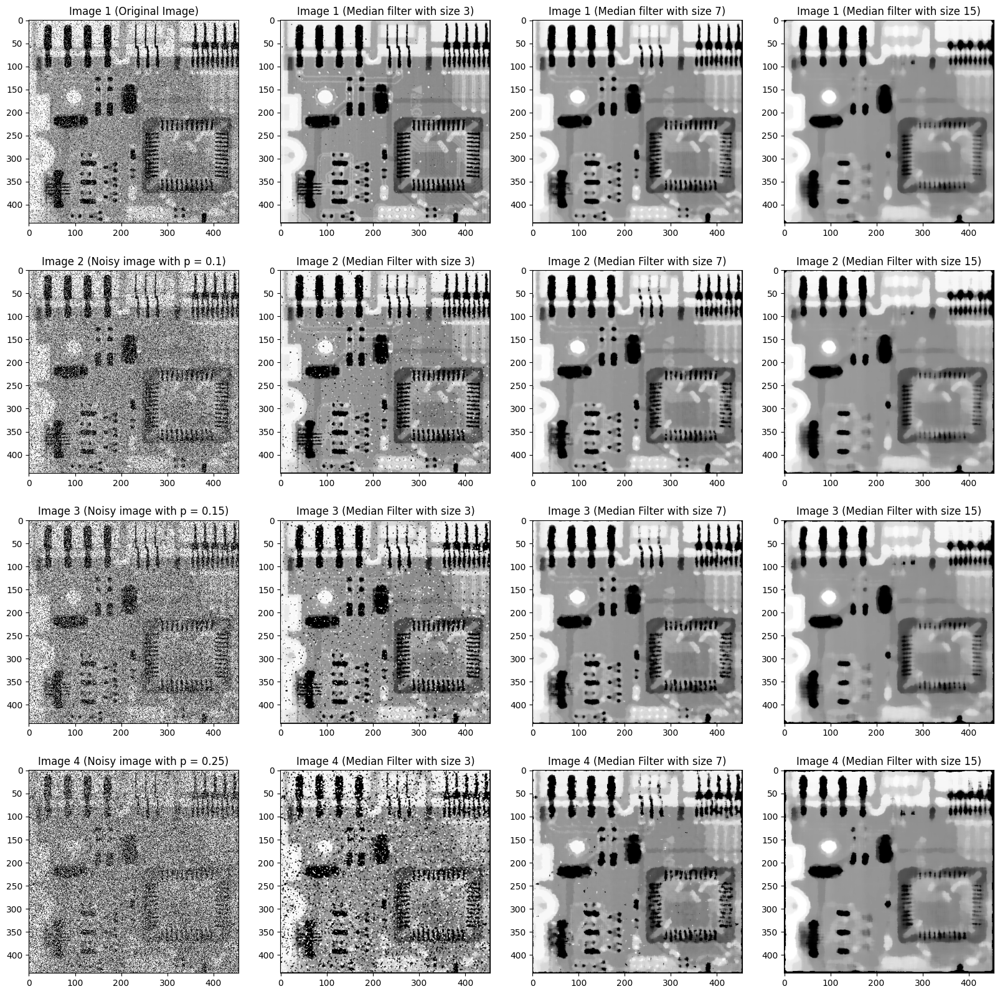

In [ ]:
fig, axs = plt.subplots(4, 4, figsize=(20, 20))

# Noise

plt.subplot(4, 4, 1)
plt.imshow(img2, cmap='gray')

plt.title("Image 1 (Original Image)")

plt.subplot(4, 4, 5)
noisy_img1 = salt_and_pepper_noise(img2, 0.1)
plt.imshow(noisy_img1, cmap='gray')

plt.title("Image 2 (Noisy image with p = 0.1)")

plt.subplot(4, 4, 9)
noisy_img2 = salt_and_pepper_noise(img2, 0.15)
plt.imshow(noisy_img2, cmap='gray')

plt.title("Image 3 (Noisy image with p = 0.15)")

plt.subplot(4, 4, 13)
noisy_img3 = salt_and_pepper_noise(img2, 0.25)
plt.imshow(noisy_img3, cmap='gray')

plt.title("Image 4 (Noisy image with p = 0.25)")


# Median of size 3
size = 3
plt.subplot(4, 4, 2)
median = median_filter(img2, size)
plt.imshow(median, cmap='gray')

plt.title("Image 1 (Median filter with size 3)")

plt.subplot(4, 4, 6)
median = median_filter(noisy_img1, size)
plt.imshow(median, cmap='gray')

plt.title("Image 2 (Median Filter with size 3)")

plt.subplot(4, 4, 10)
median = median_filter(noisy_img2, size)
plt.imshow(median, cmap='gray')

plt.title("Image 3 (Median Filter with size 3)")

plt.subplot(4, 4, 14)
median = median_filter(noisy_img3, size)
plt.imshow(median, cmap='gray')

plt.title("Image 4 (Median Filter with size 3)")


# Median of size 7
size = 7
plt.subplot(4, 4, 3)
median = median_filter(img2, size)
plt.imshow(median, cmap='gray')

plt.title("Image 1 (Median filter with size 7)")

plt.subplot(4, 4, 7)
median = median_filter(noisy_img1, size)
plt.imshow(median, cmap='gray')

plt.title("Image 2 (Median Filter with size 7)")

plt.subplot(4, 4, 11)
median = median_filter(noisy_img2, size)
plt.imshow(median, cmap='gray')

plt.title("Image 3 (Median Filter with size 7)")

plt.subplot(4, 4, 15)
median = median_filter(noisy_img3, size)
plt.imshow(median, cmap='gray')

plt.title("Image 4 (Median Filter with size 7)")


# Median of size 15
size = 15
plt.subplot(4, 4, 4)
median = median_filter(img2, size)
plt.imshow(median, cmap='gray')

plt.title("Image 1 (Median filter with size 15)")

plt.subplot(4, 4, 8)
median = median_filter(noisy_img1, size)
plt.imshow(median, cmap='gray')

plt.title("Image 2 (Median Filter with size 15)")

plt.subplot(4, 4, 12)
median = median_filter(noisy_img2, size)
plt.imshow(median, cmap='gray')

plt.title("Image 3 (Median Filter with size 15)")

plt.subplot(4, 4, 16)
median = median_filter(noisy_img3, size)
plt.imshow(median, cmap='gray')

plt.title("Image 4 (Median Filter with size 15)")


>Explanation : As the filter size increases, the images gets more smooth and blurry because of median filter, but loses fine details. But as the image gets noisier, filters of different sizes act similarly as it acts on the original image, but the result is misleading as the output depends on the amount of salt and pepper noise present.  

Text(0.5, 1.0, 'Image 4 (Max Filter with size 15)')

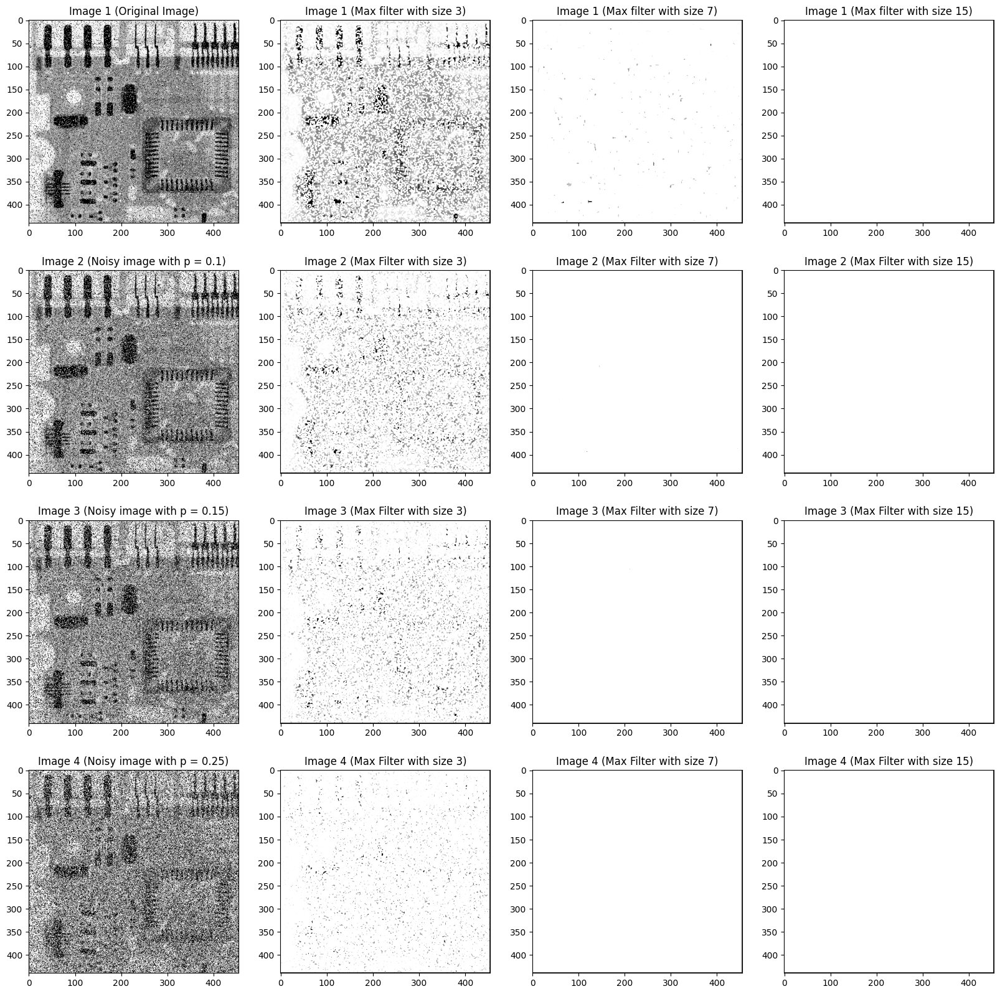

In [ ]:
fig, axs = plt.subplots(4, 4, figsize=(20, 20))

# Noise

plt.subplot(4, 4, 1)
plt.imshow(img2, cmap='gray')

plt.title("Image 1 (Original Image)")

plt.subplot(4, 4, 5)
noisy_img1 = salt_and_pepper_noise(img2, 0.1)
plt.imshow(noisy_img1, cmap='gray')

plt.title("Image 2 (Noisy image with p = 0.1)")

plt.subplot(4, 4, 9)
noisy_img2 = salt_and_pepper_noise(img2, 0.15)
plt.imshow(noisy_img2, cmap='gray')

plt.title("Image 3 (Noisy image with p = 0.15)")

plt.subplot(4, 4, 13)
noisy_img3 = salt_and_pepper_noise(img2, 0.25)
plt.imshow(noisy_img3, cmap='gray')

plt.title("Image 4 (Noisy image with p = 0.25)")


# Max of size 3
size = 3
plt.subplot(4, 4, 2)
max = max_filter(img2, size)
plt.imshow(max, cmap='gray')

plt.title("Image 1 (Max filter with size 3)")

plt.subplot(4, 4, 6)
max = max_filter(noisy_img1, size)
plt.imshow(max, cmap='gray')

plt.title("Image 2 (Max Filter with size 3)")

plt.subplot(4, 4, 10)
max = max_filter(noisy_img2, size)
plt.imshow(max, cmap='gray')

plt.title("Image 3 (Max Filter with size 3)")

plt.subplot(4, 4, 14)
max = max_filter(noisy_img3, size)
plt.imshow(max, cmap='gray')

plt.title("Image 4 (Max Filter with size 3)")


# Max of size 7
size = 7
plt.subplot(4, 4, 3)
max = max_filter(img2, size)
plt.imshow(max, cmap='gray')

plt.title("Image 1 (Max filter with size 7)")

plt.subplot(4, 4, 7)
max = max_filter(noisy_img1, size)
plt.imshow(max, cmap='gray')

plt.title("Image 2 (Max Filter with size 7)")

plt.subplot(4, 4, 11)
max = max_filter(noisy_img2, size)
plt.imshow(max, cmap='gray')

plt.title("Image 3 (Max Filter with size 7)")

plt.subplot(4, 4, 15)
max = max_filter(noisy_img3, size)
plt.imshow(max, cmap='gray')

plt.title("Image 4 (Max Filter with size 7)")


# Max of size 15
size = 15
plt.subplot(4, 4, 4)
max = max_filter(img2, size)
plt.imshow(max, cmap='gray')

plt.title("Image 1 (Max filter with size 15)")

plt.subplot(4, 4, 8)
max = max_filter(noisy_img1, size)
plt.imshow(max, cmap='gray')

plt.title("Image 2 (Max Filter with size 15)")

plt.subplot(4, 4, 12)
max = max_filter(noisy_img2, size)
plt.imshow(max, cmap='gray')

plt.title("Image 3 (Max Filter with size 15)")

plt.subplot(4, 4, 16)
max = max_filter(noisy_img3, size)
plt.imshow(max, cmap='gray')

plt.title("Image 4 (Max Filter with size 15)")


>Explanation : For max filter, as the filter size increases, the output get brighter as it takes the maximum value of each pixels neighbourhood. When the filter size is lower we can see some black dots in a white dominated picture which soon fades and turns all white as we further increase filter size.

Text(0.5, 1.0, 'Image 4 (Min Filter with size 15)')

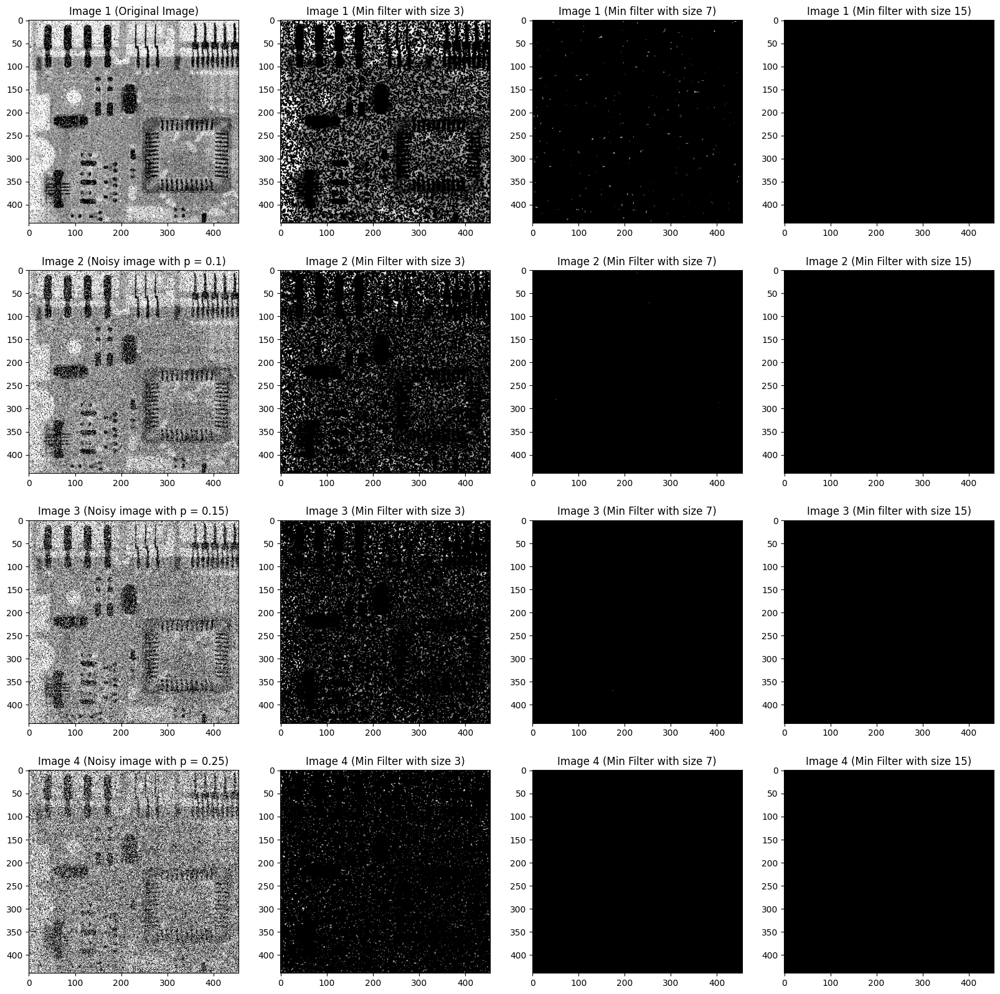

In [ ]:
fig, axs = plt.subplots(4, 4, figsize=(20, 20))

# Noise

plt.subplot(4, 4, 1)
plt.imshow(img2, cmap='gray')

plt.title("Image 1 (Original Image)")

plt.subplot(4, 4, 5)
noisy_img1 = salt_and_pepper_noise(img2, 0.1)
plt.imshow(noisy_img1, cmap='gray')

plt.title("Image 2 (Noisy image with p = 0.1)")

plt.subplot(4, 4, 9)
noisy_img2 = salt_and_pepper_noise(img2, 0.15)
plt.imshow(noisy_img2, cmap='gray')

plt.title("Image 3 (Noisy image with p = 0.15)")

plt.subplot(4, 4, 13)
noisy_img3 = salt_and_pepper_noise(img2, 0.25)
plt.imshow(noisy_img3, cmap='gray')

plt.title("Image 4 (Noisy image with p = 0.25)")


# Min of size 3
size = 3
plt.subplot(4, 4, 2)
min = min_filter(img2, size)
plt.imshow(min, cmap='gray')

plt.title("Image 1 (Min filter with size 3)")

plt.subplot(4, 4, 6)
min = min_filter(noisy_img1, size)
plt.imshow(min, cmap='gray')

plt.title("Image 2 (Min Filter with size 3)")

plt.subplot(4, 4, 10)
min = min_filter(noisy_img2, size)
plt.imshow(min, cmap='gray')

plt.title("Image 3 (Min Filter with size 3)")

plt.subplot(4, 4, 14)
min = min_filter(noisy_img3, size)
plt.imshow(min, cmap='gray')

plt.title("Image 4 (Min Filter with size 3)")


# Min of size 7
size = 7
plt.subplot(4, 4, 3)
min = min_filter(img2, size)
plt.imshow(min, cmap='gray')

plt.title("Image 1 (Min filter with size 7)")

plt.subplot(4, 4, 7)
min = min_filter(noisy_img1, size)
plt.imshow(min, cmap='gray')

plt.title("Image 2 (Min Filter with size 7)")

plt.subplot(4, 4, 11)
min = min_filter(noisy_img2, size)
plt.imshow(min, cmap='gray')

plt.title("Image 3 (Min Filter with size 7)")

plt.subplot(4, 4, 15)
min = min_filter(noisy_img3, size)
plt.imshow(min, cmap='gray')

plt.title("Image 4 (Min Filter with size 7)")


# Min of size 15
size = 15
plt.subplot(4, 4, 4)
min = min_filter(img2, size)
plt.imshow(min, cmap='gray')

plt.title("Image 1 (Min filter with size 15)")

plt.subplot(4, 4, 8)
min = min_filter(noisy_img1, size)
plt.imshow(min, cmap='gray')

plt.title("Image 2 (Min Filter with size 15)")

plt.subplot(4, 4, 12)
min = min_filter(noisy_img2, size)
plt.imshow(min, cmap='gray')

plt.title("Image 3 (Min filter with size 15)")

plt.subplot(4, 4, 16)
min = min_filter(noisy_img3, size)
plt.imshow(min, cmap='gray')

plt.title("Image 4 (Min Filter with size 15)")



>Explanation : For min filter, as the filter size increases, the output get darker as it takes the minimum values of each pixels neighbourhood. When the filter size is lower we can see some white dots in a black dominated picture which soon fades and turns all black as we further increase filter size.

# Task 3

<h3>a) Compute edge responses using Laplacian filter.</h3>

<h3> b) Display Laplacian image after scaling. </h3>

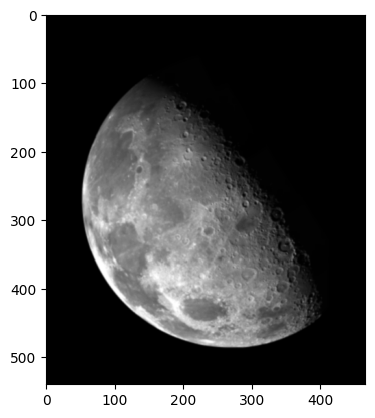

In [ ]:
img3 = cv2.imread("/content/Fig0338(a)(blurry_moon).tif")
img3 = np.array(cv2.cvtColor(img3, cv2.COLOR_BGR2GRAY))
plt.imshow(img3, cmap='gray')
plt.show()

>Explanation : We define a function that creates laplacian mask of any size, we emphasize on the central position of the mask which has the highest value and others are filled with -1. This filter highlights rapid changes in pixel intensity within an image.

In [ ]:
def laplacian_filter(size):
    if size % 2 == 0:
        raise ValueError("Filter size must be an odd number.")

    center_value = (size*size) - 1
    filter = np.full((size, size), -1)
    filter[size // 2, size // 2] = center_value
    return filter

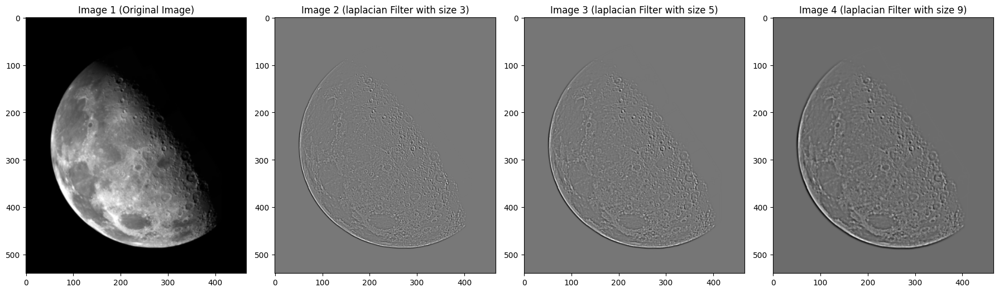

In [ ]:
fig, axs = plt.subplots(1, 4, figsize=(18, 12))

plt.subplot(1, 4, 1)
plt.imshow(img3, cmap='gray')

plt.title("Image 1 (Original Image)")

plt.subplot(1, 4, 2)
laplace = convolution(img3, laplacian_filter(3))
plt.imshow(laplace, cmap='gray')

plt.title("Image 2 (laplacian Filter with size 3)")

plt.subplot(1, 4, 3)
laplace = convolution(img3, laplacian_filter(5))
plt.imshow(laplace, cmap='gray')

plt.title("Image 3 (laplacian Filter with size 5)")

plt.subplot(1, 4, 4)
laplace = convolution(img3, laplacian_filter(9))
plt.imshow(laplace, cmap='gray')

plt.title("Image 4 (laplacian Filter with size 9)")



plt.tight_layout()
plt.show()

>Explanation : As the filter size increases we can see that the filter detects more edges. So it extracts more edge information with increasing filter size.

<h3>c) Produce the sharp output using Laplacian response: </h3>

>Explanation : The following function performs image sharpening by emphasizing edges and fine details. The function adds edge values multiplied with a scalar value to the image resulting in an image with sharper and more visible edges.

In [ ]:
def sharpen(img, constant = 1, filter_size=3):
    filter = laplacian_filter(filter_size)
    out = img + constant * convolution(img, filter)
    out = np.abs(out)
    return out

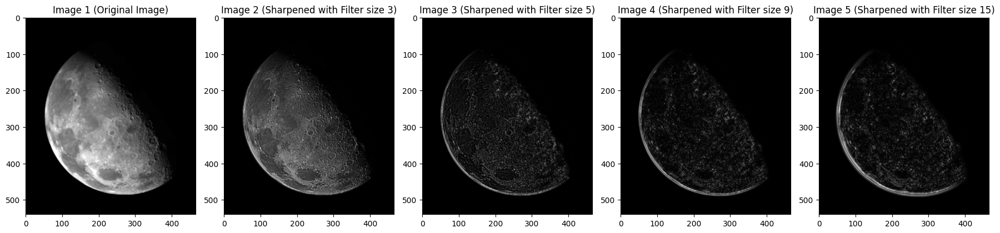

In [ ]:
fig, axs = plt.subplots(1, 5, figsize=(18, 12))

plt.subplot(1, 5, 1)
plt.imshow(img3, cmap='gray')

plt.title("Image 1 (Original Image)")

plt.subplot(1, 5, 2)
sharp = sharpen(img3, 1, 3)
plt.imshow(sharp, cmap='gray')

plt.title("Image 2 (Sharpened with Filter size 3)")

plt.subplot(1, 5, 3)
sharp = sharpen(img3, 1, 5)
plt.imshow(sharp, cmap='gray')

plt.title("Image 3 (Sharpened with Filter size 5)")

plt.subplot(1, 5, 4)
sharp = sharpen(img3, 1, 9)
plt.imshow(sharp, cmap='gray')

plt.title("Image 4 (Sharpened with Filter size 9)")


plt.subplot(1, 5, 5)
sharp = sharpen(img3, 1, 15)
plt.imshow(sharp, cmap='gray')

plt.title("Image 5 (Sharpened with Filter size 15)")


plt.tight_layout()
plt.show()

>Explanation :  The Laplacian filter calculates derivatives along each direction which leads to a sharpening effect by accentuating edges and noise (areas with rapid changes in intensity) while diminishing gradual shifts in intensity (areas with slower changes). In essence, it brings out finer image details. But a higher filter size can introduce more noise as it highlights the high contrast region more than other regions.

<h3>d) Vary user defined parameter c to obtain different levels of sharpness.</h3>

<ipython-input-102-fc0f5e0a9cc7>:3: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(1, 5, 1)
<ipython-input-102-fc0f5e0a9cc7>:8: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(1, 5, 2)
<ipython-input-102-fc0f5e0a9cc7>:14: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(1, 5, 3)
<ipython-input-102-fc0f5e0a9cc7>:20: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(1, 5, 4)


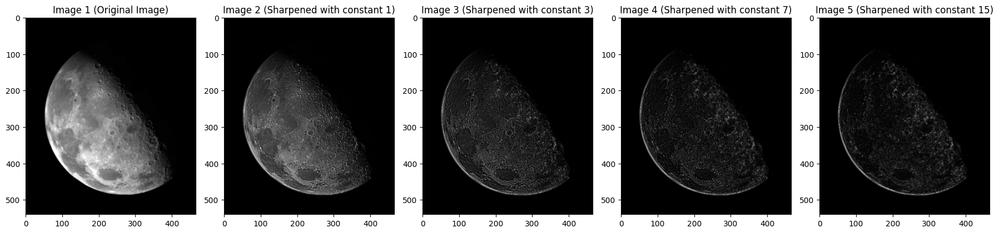

In [ ]:
fig, axs = plt.subplots(1, 4, figsize=(18, 12))

plt.subplot(1, 5, 1)
plt.imshow(img3, cmap='gray')

plt.title("Image 1 (Original Image)")

plt.subplot(1, 5, 2)
sharp = sharpen(img3, 1, 3)
plt.imshow(sharp, cmap='gray')

plt.title("Image 2 (Sharpened with constant 1)")

plt.subplot(1, 5, 3)
sharp = sharpen(img3, 3, 3)
plt.imshow(sharp, cmap='gray')

plt.title("Image 3 (Sharpened with constant 3)")

plt.subplot(1, 5, 4)
sharp = sharpen(img3, 7, 3)
plt.imshow(sharp, cmap='gray')

plt.title("Image 4 (Sharpened with constant 7)")


plt.subplot(1, 5, 5)
sharp = sharpen(img3, 15, 3)
plt.imshow(sharp, cmap='gray')

plt.title("Image 5 (Sharpened with constant 15)")


plt.tight_layout()
plt.show()

>Explanation : Increasing the constant value makes the image sharper, as it is a scalar multiple with the laplacian. So the edges are more highlighted compared to other pixels. But we can see that when c is high enough the high contrast regions are highlighted more and low contrast region fades.